<a href="https://colab.research.google.com/github/sai-23may/Style_Transfer/blob/main/DIP_PACKAGE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from __future__ import division
from torchvision import models
from torchvision import transforms
from PIL import Image
import argparse
import torch
import torchvision
import torch.nn as nn
import numpy as np
import cv2
import pandas as pd
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
device

device(type='cuda')

PRINTING LAYERS IN VGG 19

In [ ]:
model=models.vgg19(pretrained=True)
print(model)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

FUNCTION WHICH RESHAPES THE IMAGE AND CONVERTS IT INTO A TENSOR IMAGE

In [ ]:
def load_image(image_path, transform=None, max_size=None, shape=None):
    """Load an image and convert it to a torch tensor."""
    image = Image.open(image_path)
    
    if max_size:
        scale = max_size / max(image.size)
        size = np.array(image.size) * scale
        image = image.resize(size.astype(int), Image.ANTIALIAS)
    
    if shape:
        image = image.resize(shape, Image.LANCZOS)
    
    if transform:
        image = transform(image).unsqueeze(0)
    
    return image.to(device)


FUNCTION WHICH EXTRACTS FEATURE FROM RESPECTIVE LAYER

In [ ]:
class VGGNet(nn.Module):
    def __init__(self):
        """Select conv1_1 ~ conv5_1 activation maps."""
        super(VGGNet, self).__init__()
        self.select = ['0', '5', '10', '19', '28'] 
        self.vgg = models.vgg19(pretrained=True).features
        
    def forward(self, x):
        """Extract multiple convolutional feature maps."""
        features = []
        for name, layer in self.vgg._modules.items():
            x = layer(x)
            if name in self.select:
                features.append(x)
        return features

In [ ]:
def main(cont,stl):
    
    # Image preprocessing
    # Initializing the variable 
    max_size=400
    content=cont
    style=stl
    max_size=400
    total_step=2000
    log_step=10
    sample_step=500
    style_weight=100
    lr=.003

    # VGGNet was trained on ImageNet where images are normalized by mean=[0.485, 0.456, 0.406] and std=[0.229, 0.224, 0.225].
    # We use the same normalization statistics here.
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.485, 0.456, 0.406), 
                             std=(0.229, 0.224, 0.225))])
    
    # Load content and style images
    # Make the style image same size as the content image
    content = load_image(content, transform, max_size)
    style = load_image(style, transform, shape=[content.size(2), content.size(3)])
    
    # Initialize a target image with the content image
    target = content.clone().requires_grad_(True)
    
    optimizer = torch.optim.Adam([target], lr=lr, betas=[0.5, 0.999])
    vgg = VGGNet().to(device).eval()
    
    l=[]

    for step in range(total_step):
        
        # Extract multiple(5) conv feature vectors
        target_features = vgg(target)
        content_features = vgg(content)
        style_features = vgg(style)

        style_loss = 0
        content_loss = 0
        for f1, f2, f3 in zip(target_features, content_features, style_features):
            # Compute content loss with target and content images
            content_loss += torch.mean((f1 - f2)**2)

            # Reshape convolutional feature maps
            _, c, h, w = f1.size()
            f1 = f1.view(c, h * w)
            f3 = f3.view(c, h * w)

            # Compute gram matrix
            f1 = torch.mm(f1, f1.t())
            f3 = torch.mm(f3, f3.t())

            # Compute style loss with target and style images
            style_loss += torch.mean((f1 - f3)**2) / (c * h * w) 
        
        # Compute total loss, backprop and optimize
        loss = content_loss + style_weight * style_loss 
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()


        if (step+1) % sample_step == 0:
            #Denormalizing the image 
            denorm = transforms.Normalize((-2.12, -2.04, -1.80), (4.37, 4.46, 4.44))
            img = target.clone().squeeze()
            img = denorm(img).clamp_(0, 1)
            #printing the log statement
            print ('Step [{}/{}], Content Loss: {:.4f}, Style Loss: {:.4f}' .format(step+1, total_step, content_loss.item(), style_loss.item()))
            grid_img=torchvision.utils.make_grid(img)
            #appending the images into a list
            l.append(cv2.cvtColor(grid_img.cpu().detach().numpy().transpose(1,2,0), cv2.COLOR_BGR2RGB))
    #printing the image in the list
    fig, arr = plt.subplots(2, 2, figsize=(34,24))
    arr[0][0].imshow(cv2.cvtColor(l[0], cv2.COLOR_BGR2RGB))
    arr[0][0].set_title('500 epoch')
    arr[0][0].axis("off")
    arr[0][1].imshow(cv2.cvtColor(l[1], cv2.COLOR_BGR2RGB))
    arr[0][1].set_title('1000 epoch')
    arr[0][1].axis("off") 
    arr[1][0].imshow(cv2.cvtColor(l[2], cv2.COLOR_BGR2RGB))
    arr[1][0].set_title('1500 epoch')
    arr[1][0].axis("off")
    arr[1][1].imshow(cv2.cvtColor(l[3], cv2.COLOR_BGR2RGB))
    arr[1][1].set_title('2000 epoch')
    arr[1][1].axis("off")


(-0.5, 1159.5, 933.5, -0.5)

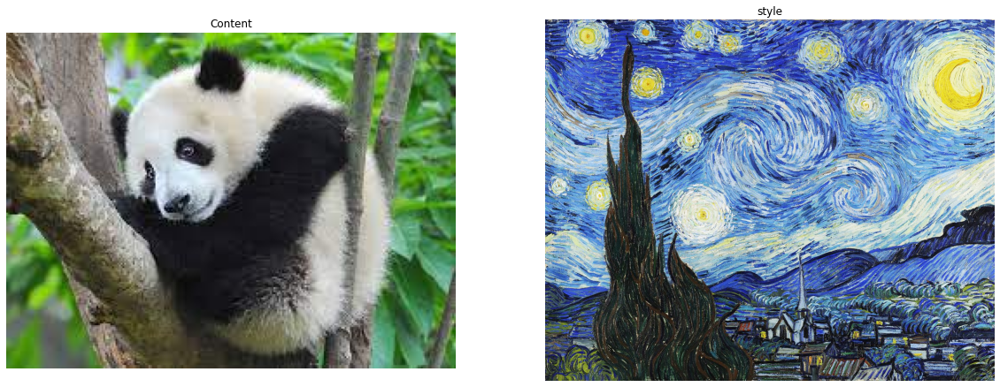

In [ ]:
content='/content/drive/MyDrive/dip_package/panda.jpg'
style='/content/drive/MyDrive/dip_package/neural_style_transfer_5_1.jpeg'
fig, arr = plt.subplots(1, 2, figsize=(20, 8))
arr[0].imshow(cv2.cvtColor(cv2.imread(content), cv2.COLOR_BGR2RGB))
arr[0].set_title('Content')
arr[0].axis("off")
arr[1].imshow(cv2.cvtColor(cv2.imread(style), cv2.COLOR_BGR2RGB))
arr[1].set_title('style')
arr[1].axis("off") 

output-500.png
output-1000.png
output-1500.png
output-2000.png


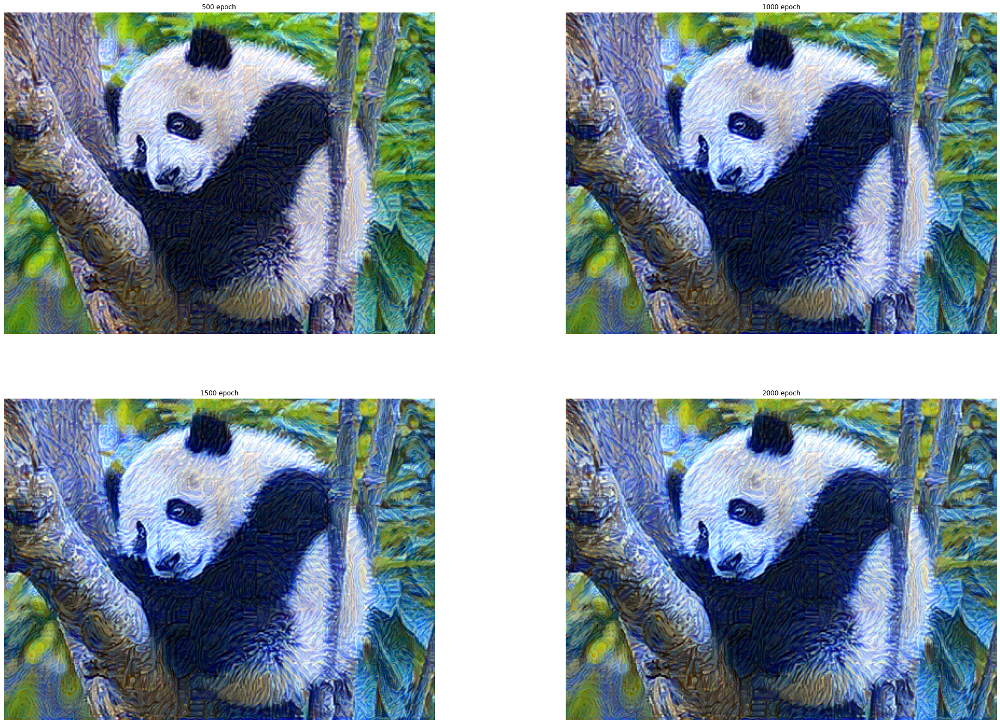

In [ ]:
content='/content/drive/MyDrive/dip_package/panda.jpg'
style='/content/drive/MyDrive/dip_package/neural_style_transfer_5_1.jpeg'
main(content,style)

(-0.5, 999.5, 964.5, -0.5)

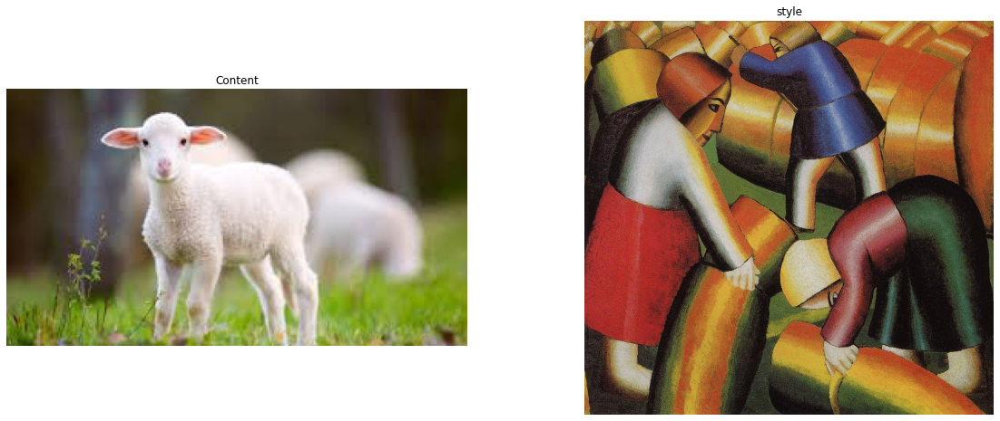

In [ ]:
content='/content/drive/MyDrive/dip_package/goat.jpg'
style='/content/drive/MyDrive/dip_package/Kazimir_Malevich_110.jpg'
fig, arr = plt.subplots(1, 2, figsize=(20, 8))
arr[0].imshow(cv2.cvtColor(cv2.imread(content), cv2.COLOR_BGR2RGB))
arr[0].set_title('Content')
arr[0].axis("off")
arr[1].imshow(cv2.cvtColor(cv2.imread(style), cv2.COLOR_BGR2RGB))
arr[1].set_title('style')
arr[1].axis("off") 

Step [500/2000], Content Loss: 33.1450, Style Loss: 15.9134
Step [1000/2000], Content Loss: 35.5221, Style Loss: 8.2294
Step [1500/2000], Content Loss: 36.8596, Style Loss: 5.3619
Step [2000/2000], Content Loss: 37.8466, Style Loss: 3.9785


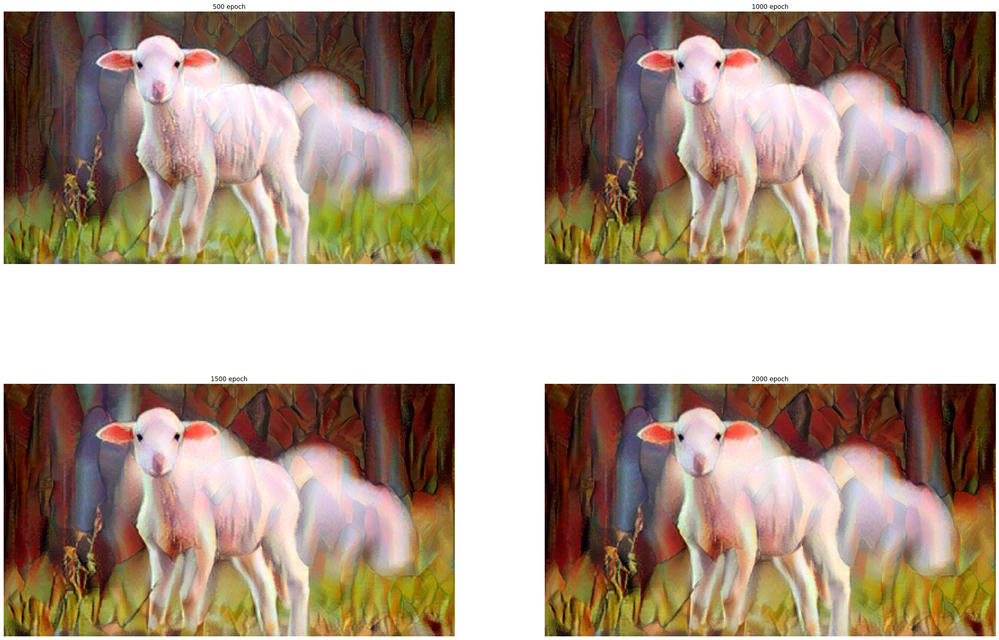

In [ ]:
content='/content/drive/MyDrive/dip_package/goat.jpg'
style='/content/drive/MyDrive/dip_package/Kazimir_Malevich_110.jpg'
main(content,style)